In [1]:
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
from torchvision.datasets.folder import default_loader
from scipy.io import loadmat
import torch

# nasty import hack - this is a code smell, work out how to remove it
import sys
sys.path.append('../')
from simcoder.models import get_model

/usr/local/lib/python3.8/dist-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
IMAGE_FILES_PER_FOLDER = 10000
mf_dir = Path('/input/images')

In [3]:
encoder_name = 'dino2'
# image_index = 140014
image_index = 55555

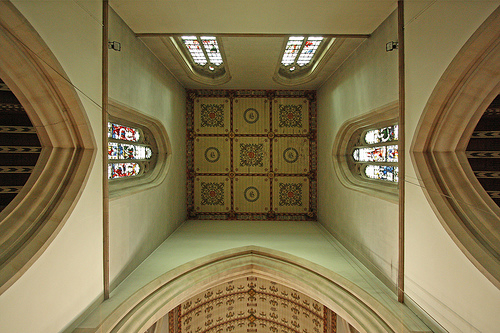

In [4]:
def get_mf_image(index: int) -> Image.Image:
    folder_idx = index // IMAGE_FILES_PER_FOLDER
    path = mf_dir / str(folder_idx) / f"{index}.jpg"
    img = default_loader(str(path))
    return img

query_image = get_mf_image(image_index)
query_image

In [5]:
def encode(query_image: Image.Image, model_name: str) -> np.array:
    # setup the pytorch device
    device = 'cuda' if torch.cuda.is_available() else 'cpu'

    # get the model
    model, preprocess = get_model(model_name)
    model.to(device)

    # preprocess the image into a tensor, 
    # add a fake batch axis
    # send it to the device (gpu or cpu)
    img = preprocess(query_image).unsqueeze(0).to(device)

    with torch.no_grad():
        features = model(img)
        features = features.detach().cpu().numpy()
    return features

features = encode(query_image, encoder_name)
features

Using cache found in /root/.cache/torch/hub/facebookresearch_dinov2_main
xFormers not available
xFormers not available


array([[ 2.9424548 , -1.7754936 ,  2.1697392 ,  2.347995  , -2.0837557 ,
        -2.1251793 ,  5.281714  , -2.7686026 , -1.9205332 , -1.0161102 ,
         1.2908723 ,  3.0985358 , -3.584817  ,  1.8726739 ,  1.6894232 ,
        -0.98814315,  1.8739669 , -2.1679263 ,  4.133521  ,  4.04787   ,
        -0.939812  , -2.9028285 ,  3.7053874 , -3.3257709 , -0.9476903 ,
        -0.59693277,  4.94095   , -0.49176288, -0.94264865,  2.3592992 ,
        -0.0738982 ,  1.6517475 , -1.0615134 ,  1.3535068 ,  1.6594946 ,
         3.7967947 , -4.730531  , -0.7777293 , -2.8742414 ,  3.625538  ,
        -0.25116137,  0.72270715, -0.6668781 , -1.1175736 , -1.1660116 ,
         2.1734643 , -0.50537646, -2.1476026 ,  1.2367482 ,  1.5243421 ,
        -2.0486639 , -0.41308686, -3.0334964 , -1.1975383 ,  3.1458445 ,
        -2.8680427 ,  4.879084  , -3.0791638 ,  0.20297739, -2.4676433 ,
         3.0682883 , -4.6234946 ,  2.467969  , -0.12556992,  1.2297398 ,
         1.5728687 ,  0.3530701 , -2.739377  ,  1.4

In [6]:
def encode(query_image: Image.Image, model_name: str) -> np.array:
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    model, preprocess = get_model(model_name)
    model.to(device)
    x = preprocess(query_image)
    x = x[None, :]
    print(x.shape)
    print(x)
    with torch.no_grad():
        features = model(x.to(device)).detach().cpu().numpy()
    return features

features = encode(query_image, encoder_name)
features

Using cache found in /root/.cache/torch/hub/facebookresearch_dinov2_main


torch.Size([1, 3, 224, 224])
tensor([[[[-0.9020, -0.8507, -0.6452,  ..., -0.4226, -0.3198, -0.1486],
          [-0.8335, -0.8507, -0.7308,  ..., -0.3712, -0.2684, -0.1143],
          [-0.9534, -0.8507, -0.6794,  ..., -0.3027, -0.2856, -0.2684],
          ...,
          [ 0.4679,  0.5193,  0.5536,  ...,  0.4508,  0.5878,  0.6049],
          [ 0.6049,  0.6049,  0.5536,  ...,  0.4851,  0.4851,  0.5536],
          [ 0.6392,  0.6563,  0.6392,  ...,  0.6221,  0.5878,  0.5193]],

         [[-1.1604, -1.0553, -0.9153,  ..., -0.4251, -0.4076, -0.3025],
          [-1.1429, -0.9853, -0.8627,  ..., -0.4776, -0.3901, -0.3200],
          [-1.1253, -1.0028, -0.8803,  ..., -0.4776, -0.3725, -0.2500],
          ...,
          [ 0.6078,  0.6429,  0.6779,  ...,  0.5903,  0.6779,  0.6954],
          [ 0.6604,  0.6954,  0.7479,  ...,  0.6254,  0.4853,  0.6429],
          [ 0.7129,  0.6954,  0.6779,  ...,  0.7304,  0.5728,  0.5378]],

         [[-1.3164, -1.3164, -1.1770,  ..., -0.9156, -0.9156, -0.8633],
 

array([[ 2.9424548 , -1.7754936 ,  2.1697392 ,  2.347995  , -2.0837557 ,
        -2.1251793 ,  5.281714  , -2.7686026 , -1.9205332 , -1.0161102 ,
         1.2908723 ,  3.0985358 , -3.584817  ,  1.8726739 ,  1.6894232 ,
        -0.98814315,  1.8739669 , -2.1679263 ,  4.133521  ,  4.04787   ,
        -0.939812  , -2.9028285 ,  3.7053874 , -3.3257709 , -0.9476903 ,
        -0.59693277,  4.94095   , -0.49176288, -0.94264865,  2.3592992 ,
        -0.0738982 ,  1.6517475 , -1.0615134 ,  1.3535068 ,  1.6594946 ,
         3.7967947 , -4.730531  , -0.7777293 , -2.8742414 ,  3.625538  ,
        -0.25116137,  0.72270715, -0.6668781 , -1.1175736 , -1.1660116 ,
         2.1734643 , -0.50537646, -2.1476026 ,  1.2367482 ,  1.5243421 ,
        -2.0486639 , -0.41308686, -3.0334964 , -1.1975383 ,  3.1458445 ,
        -2.8680427 ,  4.879084  , -3.0791638 ,  0.20297739, -2.4676433 ,
         3.0682883 , -4.6234946 ,  2.467969  , -0.12556992,  1.2297398 ,
         1.5728687 ,  0.3530701 , -2.739377  ,  1.4

In [7]:
def load_mf_encodings(encodings_dir: Path) -> np.array:
    paths = encodings_dir.glob("*.mat")
    paths = sorted(paths, key=lambda p: int(p.stem))
    encodings = [loadmat(p)["features"] for p in paths]
    encodings = np.concatenate(encodings)
    return encodings


mf_encodings = load_mf_encodings(Path('/output', f'mf_{encoder_name}'))
mf_encodings[140014]

array([ 0.4287973 , -0.40327236,  6.143079  ,  0.8766484 , -2.2060916 ,
        0.9173508 , -2.136517  ,  0.08589237, -0.28367358,  0.6214809 ,
       -2.0804908 ,  0.5545428 ,  4.2858143 ,  2.7555723 ,  0.46264887,
       -1.5299124 , -3.093712  ,  1.6782433 , -0.30468258,  0.37521943,
        1.8554641 , -2.2383723 , -3.4545703 ,  2.2649405 , -0.27769437,
        4.44223   ,  1.905553  , -0.9574117 ,  2.3183615 , -1.5283154 ,
       -2.2317145 ,  1.7731432 , -1.6361136 , -0.6725199 , -4.390739  ,
        0.7390051 , -4.105217  ,  0.71704257, -0.81600916, -0.23806274,
        5.5095496 ,  3.4717486 , -1.0480824 , -1.4681388 , -0.55820876,
        0.10533757,  0.8218396 ,  3.5207396 ,  1.4729218 , -1.7296542 ,
       -2.981543  , -0.20744477, -1.3293798 ,  0.11330169, -4.6793127 ,
        0.8637361 ,  3.6011543 ,  0.03326823,  2.506873  , -2.4909322 ,
       -3.5228434 ,  3.1282475 ,  1.9750638 ,  4.0101213 ,  1.0197849 ,
        0.60657233, -4.00249   , -1.6120996 , -0.8690151 ,  1.81

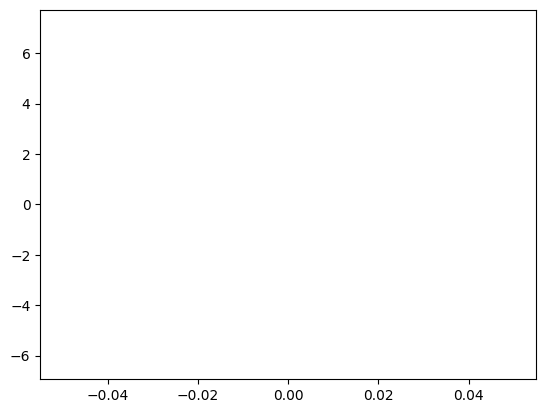

In [8]:
def show_features(features: np.array):
    plt.plot(features)
    plt.show()

show_features(features)

In [9]:
def euclid(img_features: np.array, encodings: np.array):
    distances = np.sqrt(np.sum((img_features - encodings)**2, axis=1))
    return distances

# hack 
features = mf_encodings[image_index]
# end hack

distances = euclid(features, mf_encodings)

In [10]:
def nearest(count: int):
    sorted_indices = np.argsort(distances)
    return sorted_indices[:count]

top_100_nearest = nearest(100)

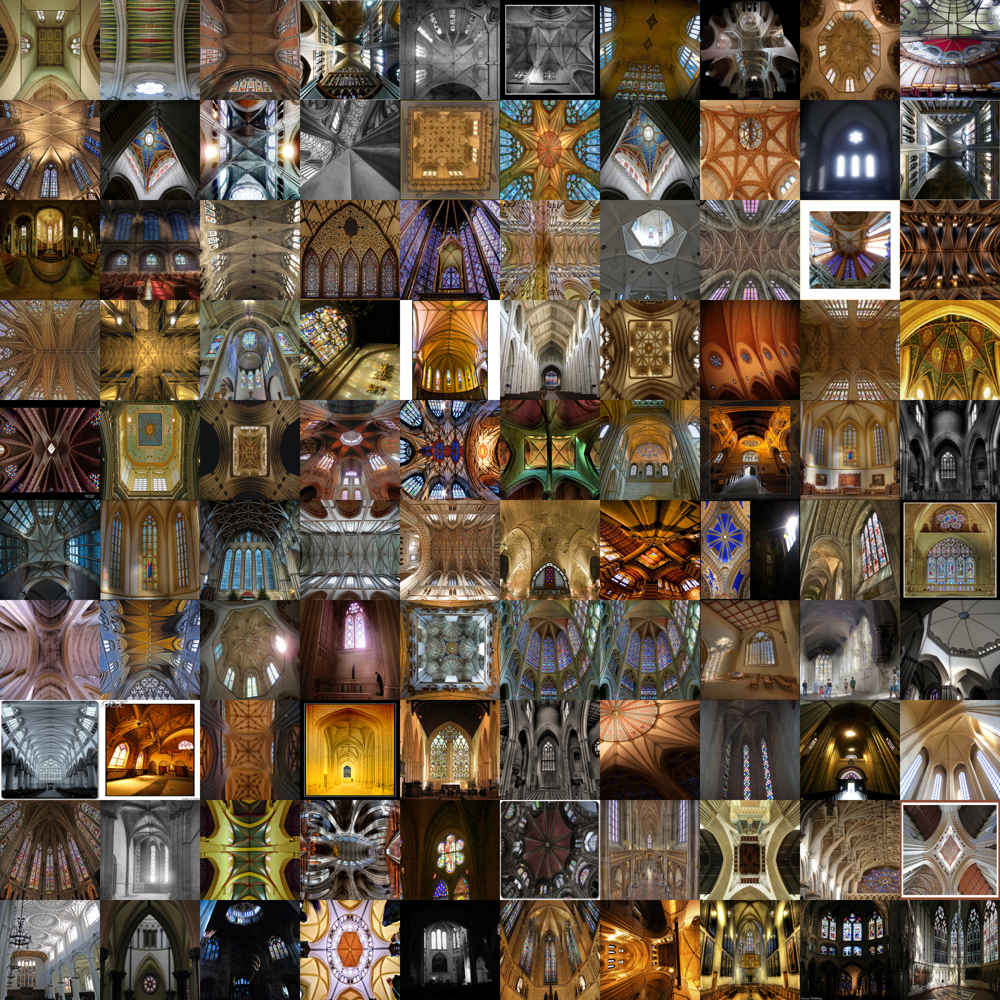

In [11]:
def show_mf_image_grid(img_indices: np.array, num_cols: int, num_rows: int, img_w: int, img_h: int) -> Image.Image:
    images = [get_mf_image(i) for i in img_indices]
    grid = Image.new('RGB', size=(num_cols*img_w, num_rows*img_h))
    for idx, img in enumerate(images):
        img = img.resize((224, 224), Image.Resampling.BILINEAR)
        grid.paste(img, box=(idx%num_cols*img_w, idx//num_cols*img_h))
    return grid


show_mf_image_grid(top_100_nearest, 10, 10, 224, 224)        